In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, Dataset
import numpy as np
from skimage.util import random_noise
import cv2
from torchvision.transforms import ToTensor


Add noise, using skimage's random_noise function

In [23]:
import os
from torchvision.datasets import ImageFolder
import numpy as np
from skimage.util import random_noise
import torch
from torch.utils.data import Dataset

class NoisyImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.dataset = ImageFolder(root_dir, transform=transform)
        self.transform = transform

    def add_noise(self, image):
        noise_type = np.random.choice(['gaussian', 'salt', 'pepper', 'speckle'])
        if noise_type == 'gaussian':
            noisy_img = random_noise(image, mode='gaussian', var=0.01)
        elif noise_type == 'salt':
            noisy_img = random_noise(image, mode='salt', amount=0.02)
        elif noise_type == 'pepper':
            noisy_img = random_noise(image, mode='pepper', amount=0.02)
        elif noise_type == 'speckle':
            noisy_img = random_noise(image, mode='speckle', var=0.01)
        return np.clip(noisy_img, 0, 1)

    def __getitem__(self, index):
        path, _ = self.dataset.samples[index]
        filename = os.path.basename(path)
        clean_img, _ = self.dataset[index]
        noisy_img = self.add_noise(clean_img.numpy().transpose(1, 2, 0))
        noisy_img = torch.tensor(noisy_img.transpose(2, 0, 1)).float()
        return noisy_img, clean_img, filename

    def __len__(self):
        return len(self.dataset)

Define denoising model with residual learning

In [ ]:
class DenoiseCNN(nn.Module):
    def __init__(self):
        super(DenoiseCNN, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # Padding to keep size same
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU()
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 3, kernel_size=3, padding=1)
        )

    def forward(self, x):
        residual = self.encoder(x)
        residual = self.decoder(residual)
        if residual.shape != x.shape:
            residual = torch.nn.functional.interpolate(residual, size=x.shape[2:], mode='bilinear', align_corners=False)
        
        denoised = x - residual
        return torch.clamp(denoised, 0, 1)

Visualization Function

In [25]:
import matplotlib.pyplot as plt

def visualize_results(original, noisy, denoised, index=0, filename=None):
    """
    Visualize the original, noisy, and denoised images side by side.
    Optionally, display the filename.
    """
    original_img = original[index].detach().cpu().permute(1, 2, 0).numpy()
    noisy_img = noisy[index].detach().cpu().permute(1, 2, 0).numpy()
    denoised_img = denoised[index].detach().cpu().permute(1, 2, 0).numpy()

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"Image: {filename if filename else 'N/A'}", fontsize=16)

    axs[0].imshow(original_img)
    axs[0].set_title('Original')
    axs[0].axis('off')

    axs[1].imshow(noisy_img)
    axs[1].set_title('Noisy')
    axs[1].axis('off')

    axs[2].imshow(denoised_img)
    axs[2].set_title('Denoised')
    axs[2].axis('off')

    plt.show()


Train model function, visualize every 500 batches

In [26]:
def train_model(model, dataloader, num_epochs=20):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        
        for i, (noisy_imgs, clean_imgs, filenames) in enumerate(dataloader):
            noisy_imgs, clean_imgs = noisy_imgs.cuda(), clean_imgs.cuda()
            
            outputs = model(noisy_imgs)
            loss = criterion(outputs, clean_imgs)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            # Visualize every 500 batches
            if i % 500 == 0:
                print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i}/{len(dataloader)}], Loss: {loss.item():.4f}")
                visualize_results(clean_imgs, noisy_imgs, outputs.detach(), index=0, filename=filenames[0])

        print(f"Epoch [{epoch+1}/{num_epochs}] completed. Average Loss: {running_loss/len(dataloader):.4f}")
    
    print("Training complete")
    return model


Evaluate Model function

In [27]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import matplotlib.pyplot as plt

def evaluate_model(model, dataloader, device='cpu'):
    """
    Evaluate the model on a given dataloader and compute PSNR and SSIM metrics.
    """
    model.eval()
    psnr_total = 0
    ssim_total = 0
    num_batches = 0

    with torch.no_grad():
        for noisy_imgs, clean_imgs, filenames in dataloader:
            noisy_imgs, clean_imgs = noisy_imgs.to(device), clean_imgs.to(device)
            
            outputs = model(noisy_imgs)
            
            batch_psnr = 0
            batch_ssim = 0

            # Compute PSNR and SSIM for each image in the batch
            for i in range(len(noisy_imgs)):
                psnr = peak_signal_noise_ratio(
                    clean_imgs[i].cpu().numpy(),
                    outputs[i].cpu().numpy(),
                    data_range=1.0 
                )
                ssim = structural_similarity(
                    clean_imgs[i].cpu().numpy().transpose(1, 2, 0),
                    outputs[i].cpu().numpy().transpose(1, 2, 0),
                    win_size=7,
                    channel_axis=-1,
                    data_range=1.0
                )
                
                batch_psnr += psnr
                batch_ssim += ssim
                print(f"Filename: {filenames[i]}, PSNR: {psnr:.4f}, SSIM: {ssim:.4f}")
            
            psnr_total += batch_psnr / len(noisy_imgs)
            ssim_total += batch_ssim / len(noisy_imgs)
            num_batches += 1

            break

    avg_psnr = psnr_total / num_batches
    avg_ssim = ssim_total / num_batches
    print(f"Average PSNR: {avg_psnr:.4f}, Average SSIM: {avg_ssim:.4f}")

    return avg_psnr, avg_ssim


Train model

cuda
Epoch [1/10], Step [0/948], Loss: 0.0368


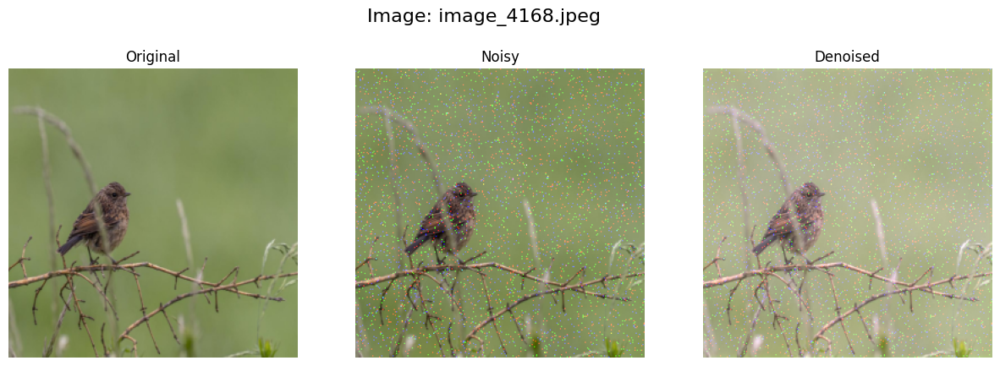

Epoch [1/10], Step [500/948], Loss: 0.0010


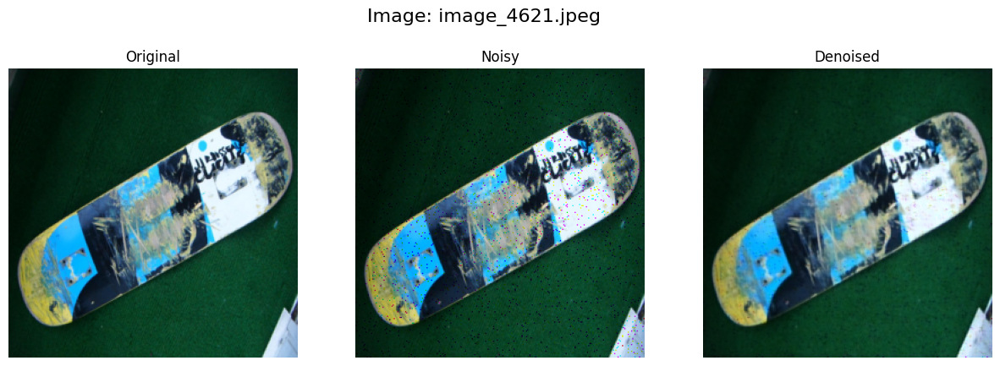

Epoch [1/10] completed. Average Loss: 0.0016
Epoch [2/10], Step [0/948], Loss: 0.0008


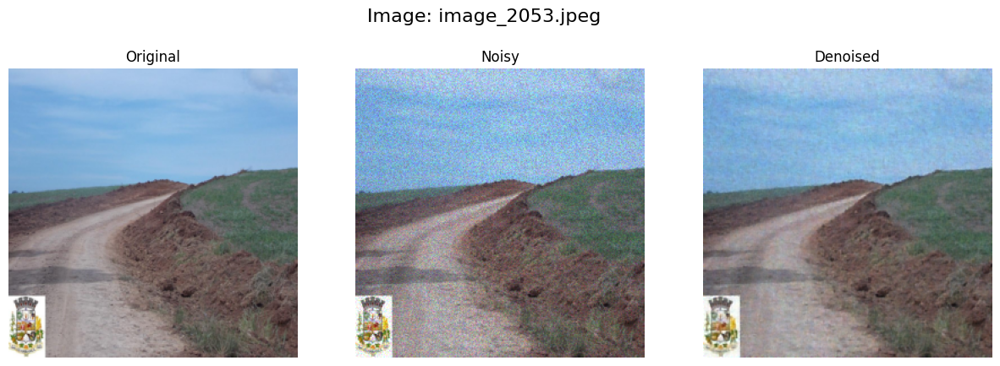

Epoch [2/10], Step [500/948], Loss: 0.0011


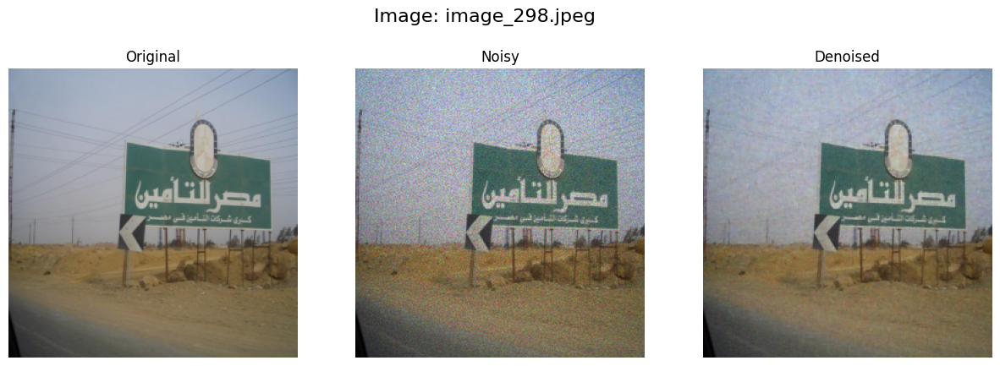

Epoch [2/10] completed. Average Loss: 0.0006
Epoch [3/10], Step [0/948], Loss: 0.0004


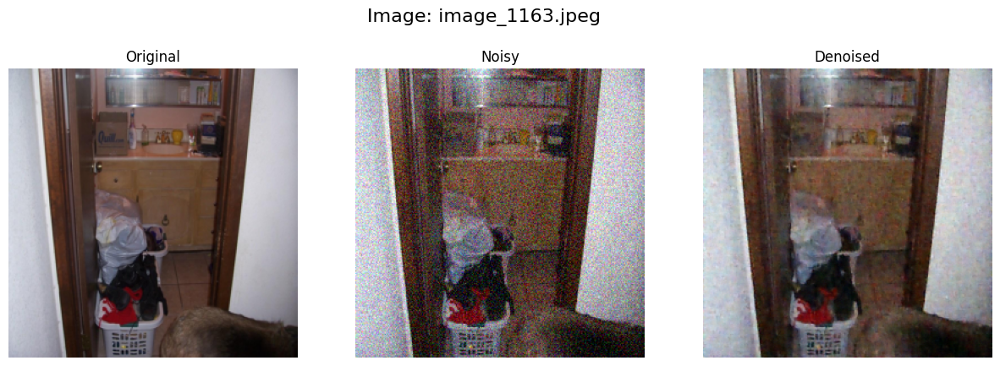

Epoch [3/10], Step [500/948], Loss: 0.0009


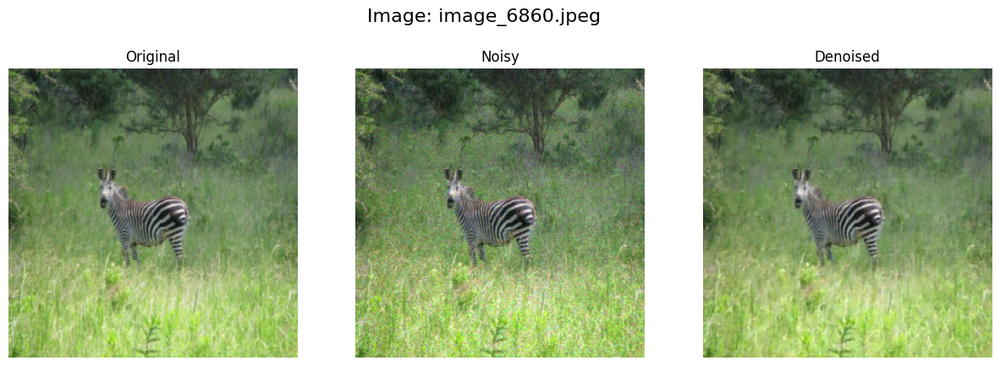

Epoch [3/10] completed. Average Loss: 0.0005
Epoch [4/10], Step [0/948], Loss: 0.0006


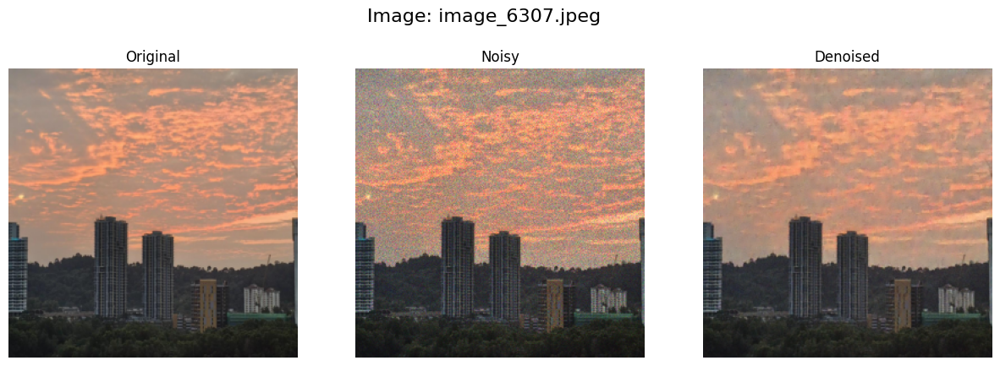

Epoch [4/10], Step [500/948], Loss: 0.0003


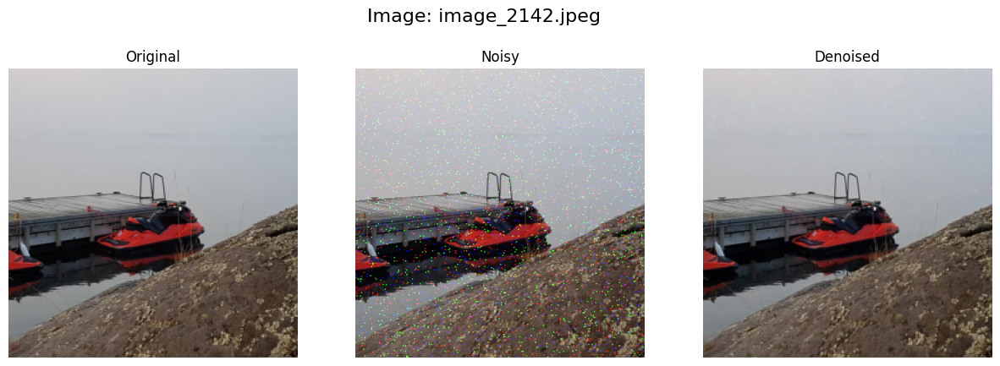

Epoch [4/10] completed. Average Loss: 0.0004
Epoch [5/10], Step [0/948], Loss: 0.0005


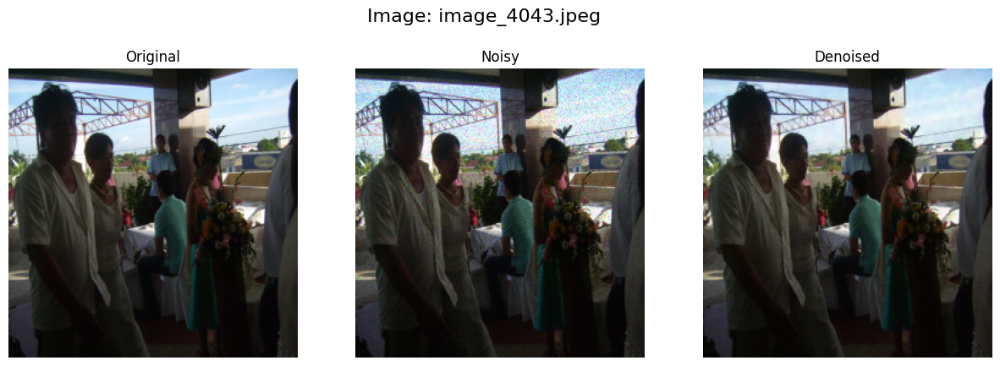

Epoch [5/10], Step [500/948], Loss: 0.0003


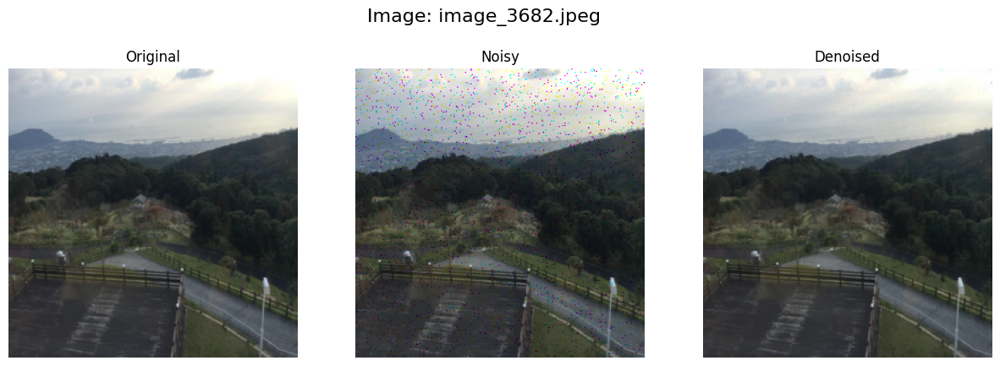

Epoch [5/10] completed. Average Loss: 0.0004
Epoch [6/10], Step [0/948], Loss: 0.0007


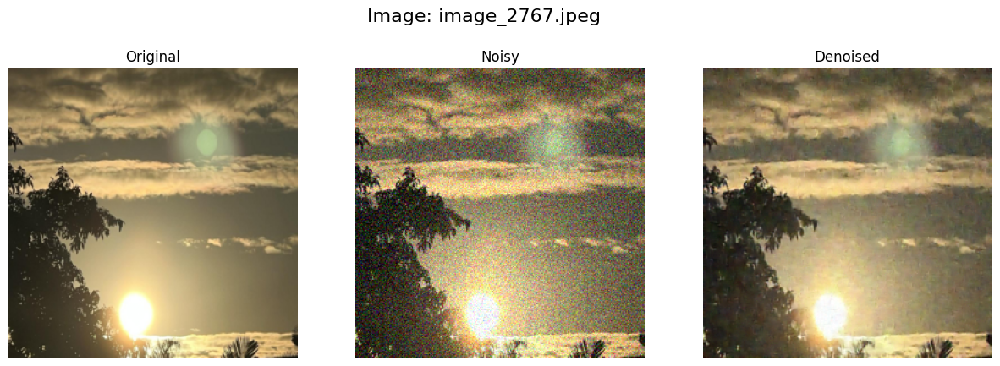

Epoch [6/10], Step [500/948], Loss: 0.0002


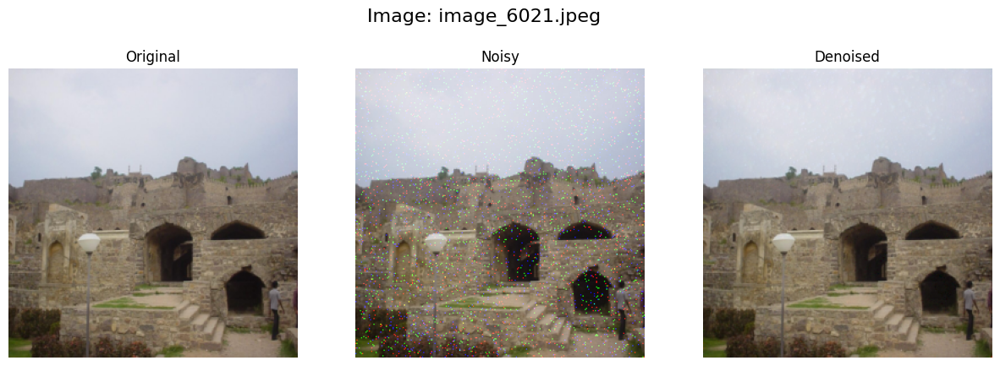

Epoch [6/10] completed. Average Loss: 0.0004
Epoch [7/10], Step [0/948], Loss: 0.0003


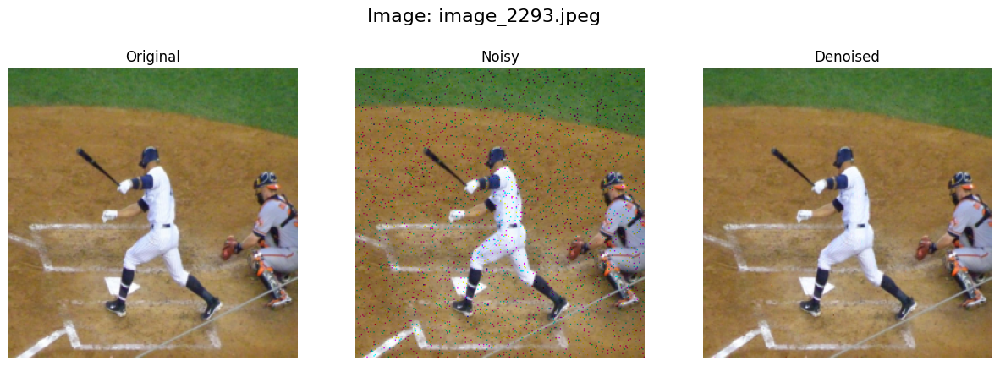

Epoch [7/10], Step [500/948], Loss: 0.0002


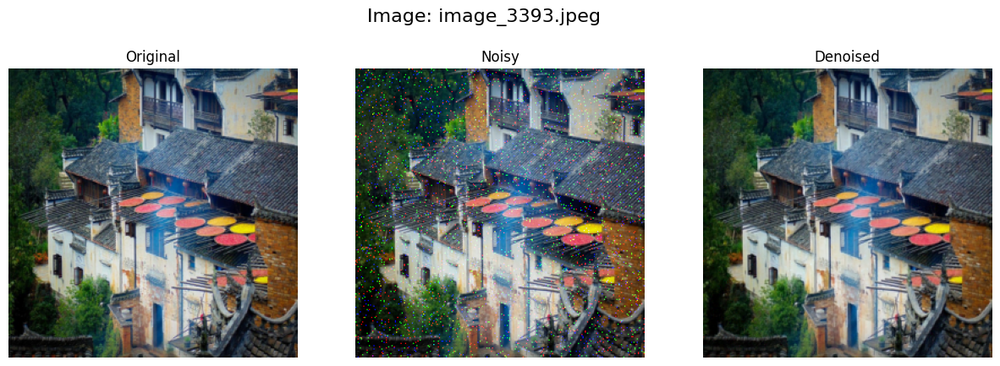

Epoch [7/10] completed. Average Loss: 0.0004
Epoch [8/10], Step [0/948], Loss: 0.0001


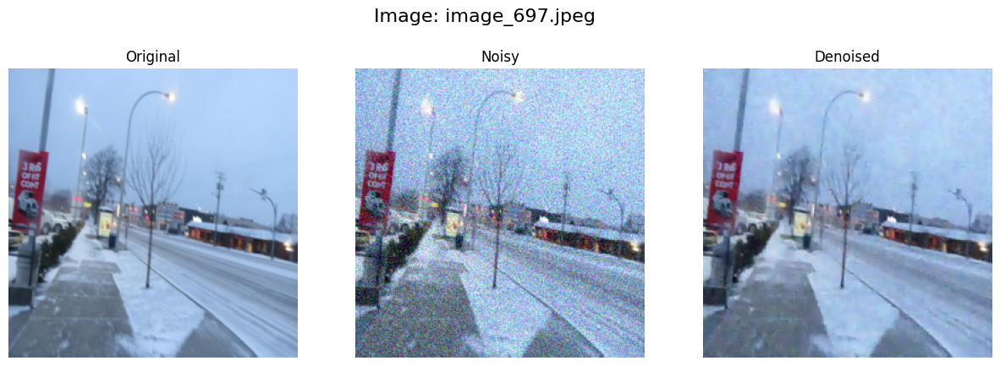

Epoch [8/10], Step [500/948], Loss: 0.0003


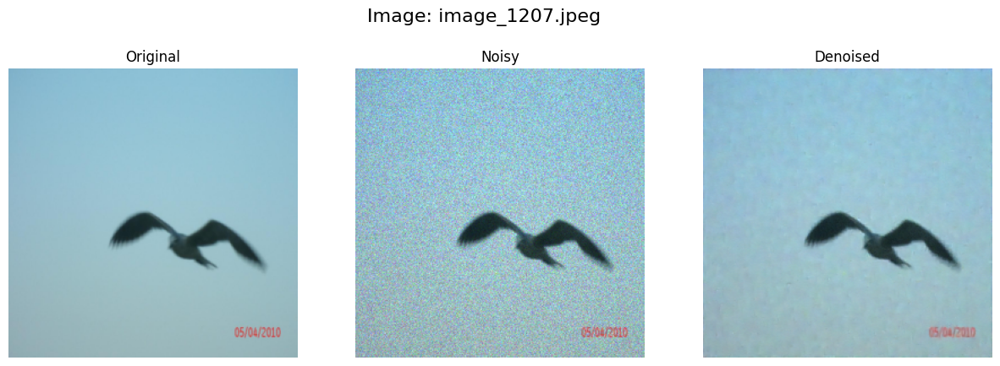

Epoch [8/10] completed. Average Loss: 0.0004
Epoch [9/10], Step [0/948], Loss: 0.0002


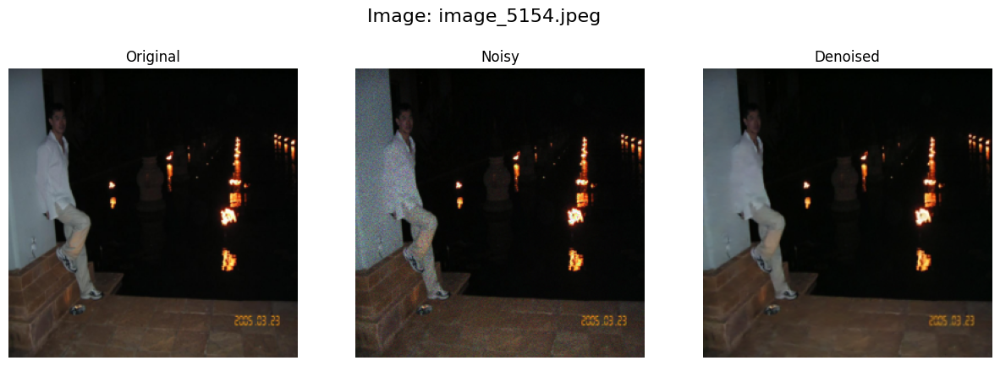

Epoch [9/10], Step [500/948], Loss: 0.0005


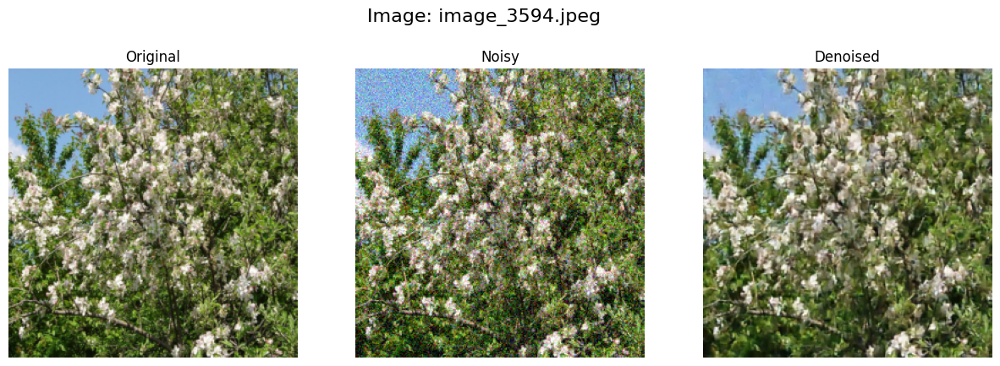

Epoch [9/10] completed. Average Loss: 0.0004
Epoch [10/10], Step [0/948], Loss: 0.0005


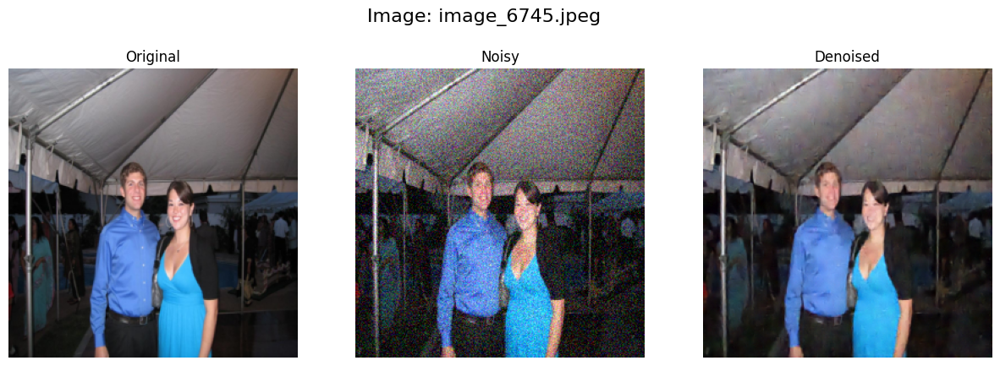

Epoch [10/10], Step [500/948], Loss: 0.0010


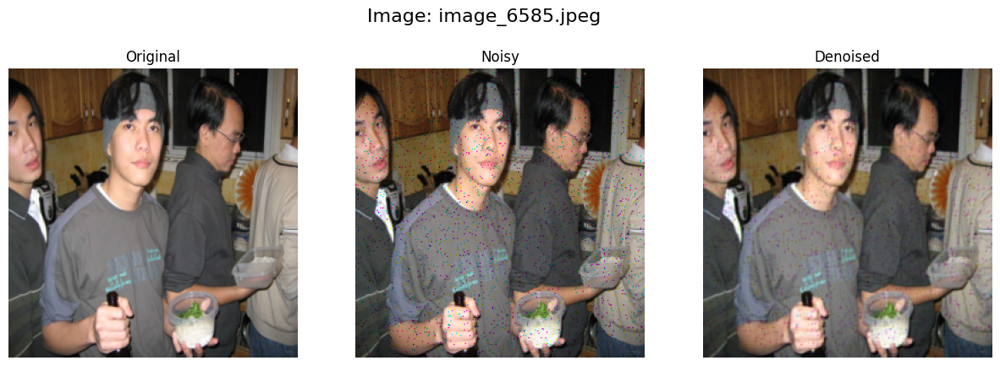

Epoch [10/10] completed. Average Loss: 0.0020
Training complete


In [28]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

dataset = NoisyImageDataset(root_dir='images_big', transform=transform)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

model = DenoiseCNN().cuda()
trained_model = train_model(model, dataloader, num_epochs=10) 

Evaluate Model

In [29]:
evaluate_model(trained_model, dataloader, device)

Filename: image_2577.jpeg, PSNR: 36.4169, SSIM: 0.9401
Filename: image_3647.jpeg, PSNR: 37.5433, SSIM: 0.8990
Filename: image_96.jpeg, PSNR: 36.8350, SSIM: 0.9134
Filename: image_771.jpeg, PSNR: 31.6461, SSIM: 0.9507
Filename: image_6062.jpeg, PSNR: 34.0859, SSIM: 0.8730
Filename: image_2119.jpeg, PSNR: 28.3337, SSIM: 0.7750
Filename: image_7252.jpeg, PSNR: 36.6637, SSIM: 0.9144
Filename: image_6439.jpeg, PSNR: 34.6272, SSIM: 0.8813
Average PSNR: 34.5190, Average SSIM: 0.8934


(34.51898236956296, 0.8933606073260307)